In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img_right_rgb = cv2.imread("../data/right.jpg")
img_right_gray = cv2.cvtColor(img_right_rgb, cv2.COLOR_BGR2GRAY)
img_left_rgb = cv2.imread("../data/left.jpg")
img_left_gray = cv2.cvtColor(img_left_rgb, cv2.COLOR_BGR2GRAY)

In [3]:
fast = cv2.FastFeatureDetector_create()
sift = cv2.SIFT_create()
kp_r = fast.detect(img_right_gray, None)
kp_l = fast.detect(img_left_gray, None)
des_r = sift.compute(img_right_gray, kp_r)[1]
des_l = sift.compute(img_left_gray, kp_l)[1]

In [4]:
bf = cv2.BFMatcher()
matches = bf.knnMatch(des_r, des_l, k=2)
good = []
dist_ratio = 0.9
for m in matches:
    if (m[0].distance / m[1].distance) < dist_ratio:
        good.append(m)
matches = np.asarray(good)

In [5]:
if len(matches[:, 0]) < 4:
    raise AssertionError("Homography is not available. Number of keypoints lessthan 4")
left = np.float32([kp_r[m.queryIdx].pt for m in matches[:, 0]]).reshape(-1, 1, 2)
right = np.float32([kp_l[m.trainIdx].pt for m in matches[:, 0]]).reshape(-1, 1, 2)
H, mask = cv2.findHomography(left, right, cv2.RANSAC, 5.0)

In [6]:
img_result = cv2.warpPerspective(
    img_right_rgb,
    H,
    (img_right_rgb.shape[1] + img_left_rgb.shape[1], img_left_rgb.shape[0]),
)
img_result[0 : img_left_rgb.shape[0], 0 : img_left_rgb.shape[1]] = img_left_rgb

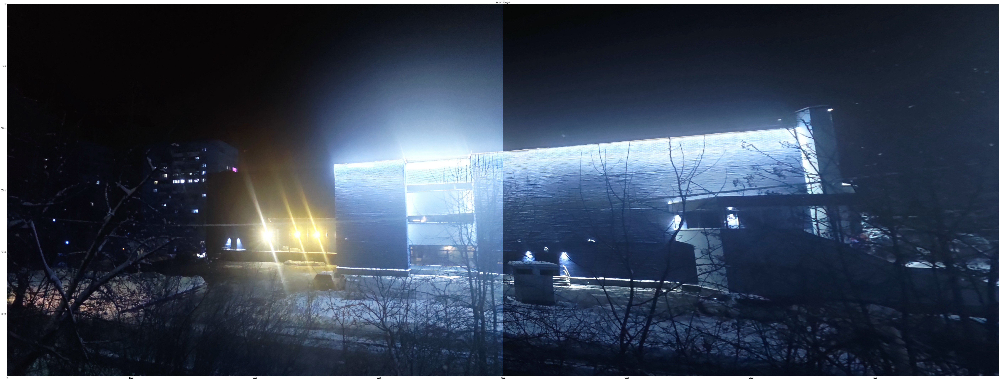

In [7]:
plt.figure(figsize=(100,100))
plt.title("result image")
plt.imshow(img_result)
plt.show()